In [1]:
import os.path
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt

In [2]:
dir(models)

['AlexNet',
 'AlexNet_Weights',
 'ConvNeXt',
 'ConvNeXt_Base_Weights',
 'ConvNeXt_Large_Weights',
 'ConvNeXt_Small_Weights',
 'ConvNeXt_Tiny_Weights',
 'DenseNet',
 'DenseNet121_Weights',
 'DenseNet161_Weights',
 'DenseNet169_Weights',
 'DenseNet201_Weights',
 'EfficientNet',
 'EfficientNet_B0_Weights',
 'EfficientNet_B1_Weights',
 'EfficientNet_B2_Weights',
 'EfficientNet_B3_Weights',
 'EfficientNet_B4_Weights',
 'EfficientNet_B5_Weights',
 'EfficientNet_B6_Weights',
 'EfficientNet_B7_Weights',
 'EfficientNet_V2_L_Weights',
 'EfficientNet_V2_M_Weights',
 'EfficientNet_V2_S_Weights',
 'GoogLeNet',
 'GoogLeNetOutputs',
 'GoogLeNet_Weights',
 'Inception3',
 'InceptionOutputs',
 'Inception_V3_Weights',
 'MNASNet',
 'MNASNet0_5_Weights',
 'MNASNet0_75_Weights',
 'MNASNet1_0_Weights',
 'MNASNet1_3_Weights',
 'MaxVit',
 'MaxVit_T_Weights',
 'MobileNetV2',
 'MobileNetV3',
 'MobileNet_V2_Weights',
 'MobileNet_V3_Large_Weights',
 'MobileNet_V3_Small_Weights',
 'RegNet',
 'RegNet_X_16GF_Weights'

This code imports the `models` module from the `torchvision` library and lists the names of all the functions and classes defined in the module using the `dir()` function.

The `models` module contains a collection of pre-trained models for image classification, object detection, segmentation, and other tasks. Some of the popular models included in this module are AlexNet, VGG, ResNet, and Inception.

In [3]:
alex = models.AlexNet()

This code creates an instance of the AlexNet model from the `models` module of the `torchvision` library. 

AlexNet is a convolutional neural network that was introduced in 2012 and won the ImageNet Large Scale Visual Recognition Challenge that year. It consists of 5 convolutional layers, 3 fully connected layers, and a softmax output layer. The model is designed to classify images into 1000 different categories, such as "dog", "cat", "car", "airplane", etc. 

The `AlexNet` class is defined in the `models` module of the `torchvision` library, which provides a collection of pre-trained models for image classification, object detection, segmentation, and other tasks.

In [4]:
res = models.resnet101(pretrained=True)

/home/nordin/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/nordin/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


This code creates an instance of the ResNet-101 model from the `models` module of the `torchvision` library and loads the pre-trained weights for the model.

ResNet-101 is a convolutional neural network that was introduced in 2015 and won the ImageNet Large Scale Visual Recognition Challenge that year. It consists of 101 layers and is designed to classify images into 1000 different categories, such as "dog", "cat", "car", "airplane", etc. 

The `resnet101` function is defined in the `models` module of the `torchvision` library, which provides a collection of pre-trained models for image classification, object detection, segmentation, and other tasks. The `pretrained=True` argument loads the pre-trained weights for the model.

In [5]:
res

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

This code outputs the `res` variable, which is an instance of the ResNet-101 model from the `models` module of the `torchvision` library. 

Note that printing the `res` variable does not show the pre-trained weights for the model, which are loaded separately using the `pretrained=True` argument when creating the instance of the model.

In [6]:
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

This code imports the `transforms` module from the `torchvision` library and creates a data preprocessing pipeline using the `Compose` class.

The `preprocess` pipeline consists of four transformations:

1. `Resize(256)`: Resizes the input image to a square of size 256x256 pixels. This transformation preserves the aspect ratio of the original image.

2. `CenterCrop(224)`: Crops the center of the resized image to a square of size 224x224 pixels. This transformation is commonly used for image classification tasks.

3. `ToTensor()`: Converts the cropped image to a PyTorch tensor. This transformation also scales the pixel values from the range [0, 255] to the range [0, 1].

4. `Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])`: Normalizes the tensor by subtracting the mean and dividing by the standard deviation. This transformation is commonly used to improve the performance of deep learning models. The mean and standard deviation values used here are the ones recommended for the ImageNet dataset, which is the dataset on which many pre-trained models are trained.

In [7]:
if not os.path.exists('./04-dog-breeds-dalmation.jpg'):
    !wget https://www.rd.com/wp-content/uploads/2016/01/04-dog-breeds-dalmation.jpg
img = Image.open('./04-dog-breeds-dalmation.jpg')

This code imports the `Image` class from the `PIL` (Python Imaging Library) module and downloads an image of a Dalmatian dog from the internet using the `wget` command. 

The `Image.open()` method is then used to open the downloaded image file and create an `Image` object called `img`. This object can be used to perform various operations on the image, such as resizing, cropping, and applying filters.

You can use the `requests` library to download an image from a URL and then open it directly with `PIL`. Here's an example:
```python
    import requests
    from PIL import Image

    url = 'https://www.rd.com/wp-content/uploads/2016/01/04-dog-breeds-dalmation.jpg'
    response = requests.get(url, stream=True)
    img = Image.open(response.raw)
```

In this example, the `requests.get()` method is used to download the image from the URL and the `stream=True` argument is used to download the image in chunks rather than all at once. The `response.raw` object is then passed to the `Image.open()` method to create the `Image` object.


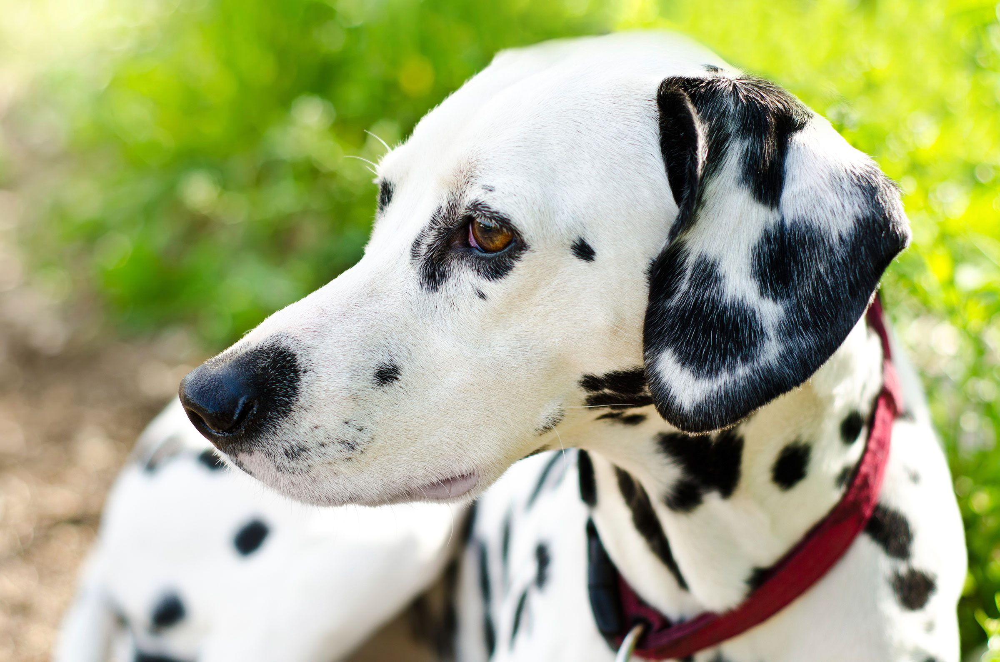

In [8]:
img

In [9]:
img_t = preprocess(img)

The purpose of normalizing the tensor in the preprocessing pipeline is to scale the pixel values to a range that is more suitable for deep learning models. 

Deep learning models are often sensitive to the scale of the input data, and normalizing the data can help improve the performance of the model. In the case of image data, the pixel values are usually in the range [0, 255], which is a large range that can cause numerical instability in the model. 

By subtracting the mean and dividing by the standard deviation, the pixel values are scaled to a range that is centered around zero and has a standard deviation of 1. This makes the data more numerically stable and easier for the model to learn from. 

The mean and standard deviation values used for normalization are often precomputed on a large dataset, such as ImageNet, and are provided as a standard for many pre-trained models.

This code applies the `preprocess` pipeline to the `img` object, which is an instance of the `Image` class from the `PIL` module. 

The `preprocess` pipeline consists of four transformations: resizing, center cropping, converting to tensor, and normalization. The `img` object is first resized to a square of size 256x256 pixels, then cropped to a square of size 224x224 pixels at the center of the image. The resulting cropped image is then converted to a PyTorch tensor and normalized using the mean and standard deviation values specified in the `Normalize` transformation.

The output of this code is a PyTorch tensor `img_t` that represents the preprocessed image. The tensor has shape `(3, 224, 224)`, where the first dimension represents the color channels (RGB) and the other two dimensions represent the height and width of the image.

In [10]:
batch_t = torch.unsqueeze(img_t, 0)

This code creates a batch of images from a single image tensor `img_t` using the `unsqueeze()` method of PyTorch.

The `unsqueeze()` method adds an extra dimension to the tensor at the specified position. In this case, we add an extra dimension at position 0, which corresponds to the batch dimension. This effectively creates a batch of size 1 from the single image tensor `img_t`.

The resulting `batch_t` tensor has shape `(1, 3, 224, 224)`, where the first dimension represents the batch size, the second dimension represents the color channels (RGB), and the other two dimensions represent the height and width of the image. This batch can be used as input to a deep learning model that expects a batch of images as input.

In [11]:
res.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

This code sets the ResNet-101 model `res` to evaluation mode using the `eval()` method of PyTorch.

When a model is in evaluation mode, it disables certain operations, such as dropout and batch normalization, that are used during training to improve the performance of the model. This is because these operations are not needed during inference, when we want to make predictions on new data.

By setting the model to evaluation mode, we ensure that the same operations are used during training and inference, which can help improve the reproducibility of our results.

In [12]:
out = res(batch_t)
out

tensor([[-3.2307e+00, -3.3578e-01,  1.2586e-01,  2.8750e-02, -5.4191e-01,
         -5.2617e-01,  1.6285e+00, -1.4999e+00, -5.6240e-01, -3.5132e+00,
          2.6558e-01,  6.5339e-01, -1.4268e+00, -7.9810e-01, -1.0312e+00,
         -1.4211e+00, -1.9464e+00, -5.2839e-01, -1.3067e+00,  1.2305e-01,
         -3.0661e+00,  1.8208e-01, -2.3006e+00, -1.2451e+00,  5.7040e-02,
         -1.9497e+00, -6.6038e-01, -2.1920e+00,  1.0652e+00, -8.0819e-01,
         -1.4044e+00, -1.6478e+00, -7.8319e-01,  5.1896e-02,  1.0598e+00,
         -1.8134e+00,  2.6159e+00, -1.5106e+00,  1.1114e+00, -1.5705e+00,
         -1.3174e+00,  6.0209e-01, -2.5181e+00, -3.6161e+00, -2.1483e+00,
          5.6300e-02, -3.7972e-01, -2.3438e+00, -1.7939e+00, -2.8770e+00,
         -6.5073e-01,  9.1167e-01, -1.4984e+00, -2.4751e+00, -9.1956e-01,
         -3.3935e+00,  4.8404e-01, -1.1094e+00, -1.6895e+00, -1.0490e+00,
         -5.6474e-01,  5.3792e-01, -2.0945e+00, -1.6969e+00, -2.4526e+00,
          9.7507e-01, -3.0534e+00, -1.

This code passes the batch of preprocessed images `batch_t` through the ResNet-101 model `res` to obtain the output tensor `out`.

The `out` tensor has shape `(1, 1000)`, where the first dimension represents the batch size (which is 1 in this case) and the second dimension represents the number of output classes (which is 1000 for the ImageNet dataset). 

Each element of the `out` tensor represents the model's confidence score for a particular class. To obtain the predicted class label, we can take the index of the element with the highest score using the `argmax()` method of PyTorch.

In [13]:
if not os.path.isfile('./4e1342c10a71981d0b491e1b8227328b/imagenet_classes.txt'):
!git clone https://gist.github.com/4e1342c10a71981d0b491e1b8227328b.git
with open('./4e1342c10a71981d0b491e1b8227328b/imagenet_classes.txt') as f:
    labels = [line.strip() for line in f.readlines()[4:]]

IndentationError: expected an indented block after 'if' statement on line 1 (671588273.py, line 2)

This code clones a GitHub Gist repository that contains a file `imagenet_classes.txt` with the class labels for the ImageNet dataset.

The `!git clone` command is a shell command that clones the repository to the current directory. The repository contains only one file, `imagenet_classes.txt`, which is a text file with one class label per line. The python library `requests` can also be used to download the file from the URL.

The `with open()` statement opens the `imagenet_classes.txt` file and reads its contents into a list called `labels`. The `strip()` method is used to remove any leading or trailing whitespace from each line, and the `[4:]` slice is used to skip the first four lines of the file, which contain metadata. 

The resulting `labels` list contains the 1000 class labels for the ImageNet dataset, in the same order as the output of the ResNet-101 model.

In [ ]:
labels

['0, tench',
 '1, goldfish',
 '2, great_white_shark',
 '3, tiger_shark',
 '4, hammerhead',
 '5, electric_ray',
 '6, stingray',
 '7, cock',
 '8, hen',
 '9, ostrich',
 '10, brambling',
 '11, goldfinch',
 '12, house_finch',
 '13, junco',
 '14, indigo_bunting',
 '15, robin',
 '16, bulbul',
 '17, jay',
 '18, magpie',
 '19, chickadee',
 '20, water_ouzel',
 '21, kite',
 '22, bald_eagle',
 '23, vulture',
 '24, great_grey_owl',
 '25, European_fire_salamander',
 '26, common_newt',
 '27, eft',
 '28, spotted_salamander',
 '29, axolotl',
 '30, bullfrog',
 '31, tree_frog',
 '32, tailed_frog',
 '33, loggerhead',
 '34, leatherback_turtle',
 '35, mud_turtle',
 '36, terrapin',
 '37, box_turtle',
 '38, banded_gecko',
 '39, common_iguana',
 '40, American_chameleon',
 '41, whiptail',
 '42, agama',
 '43, frilled_lizard',
 '44, alligator_lizard',
 '45, Gila_monster',
 '46, green_lizard',
 '47, African_chameleon',
 '48, Komodo_dragon',
 '49, African_crocodile',
 '50, American_alligator',
 '51, triceratops',
 

In [ ]:
_, index = torch.max(out, 1)

This code uses the `torch.max()` function to find the index of the class with the highest confidence score in the output tensor `out`.

The `torch.max()` function returns a tuple containing the maximum value and its index along a specified dimension of a tensor. In this case, we specify `dim=1` to find the maximum value and its index along the second dimension of the `out` tensor, which represents the output classes.

The `_` variable is used to discard the maximum value, since we are only interested in the index of the maximum value. The `index` variable is assigned the index of the class with the highest confidence score, which can be used to look up the corresponding class label in the `labels` list.

GitHub Copilot: Yes, you can use the `torch.argmax()` function instead of `torch.max()` to obtain the index of the class with the highest confidence score in the output tensor `out`. 

Here's an example:

```python
index = torch.argmax(out)
```


In [ ]:
percentage = torch.nn.functional.softmax(out, dim=1)[0] * 100
labels[index[0]], percentage[index[0]].item()

('251, dalmatian', 99.962890625)

This code uses the `torch.nn.functional.softmax()` function to convert the output tensor `out` into a probability distribution over the 1000 classes of the ImageNet dataset. 

The `softmax()` function applies the softmax function to each element of the tensor along the specified dimension (in this case, `dim=1`). This ensures that the resulting tensor contains values between 0 and 1 that sum to 1 along the specified dimension.

The resulting `percentage` tensor contains the probability of each class in the output tensor `out`, expressed as a percentage. The probability of the predicted class can be obtained by indexing into the `percentage` tensor using the `index` variable.

The `labels[index[0]]` expression returns the class label corresponding to the predicted class index, and the `percentage[index[0]].item()` expression returns the probability of the predicted class as a float value. The `item()` method is used to extract the probability value from the tensor.

In [ ]:
_, indices = torch.sort(out, descending=True)
[(labels[idx], percentage[idx].item()) for idx in indices[0][:5]]

[('251, dalmatian', 99.962890625),
 ('246, Great_Dane', 0.01685229502618313),
 ('910, wooden_spoon', 0.0053071859292685986),
 ('290, jaguar', 0.000769200676586479),
 ('222, kuvasz', 0.0007311051595024765)]

This code uses the `torch.sort()` function to sort the output tensor `out` in descending order along the second dimension, which represents the output classes. 

The `torch.sort()` function returns a tuple containing the sorted tensor and its corresponding indices along the specified dimension. In this case, we specify `dim=1` to sort the tensor along the second dimension.

The `_` variable is used to discard the sorted tensor, since we are only interested in the sorted indices. The `indices` variable is assigned the sorted indices of the output classes, in descending order of confidence score.

The list comprehension then uses the sorted indices to look up the corresponding class labels and probability scores in the `labels` and `percentage` tensors, respectively. The resulting list contains the top 5 predicted class labels and their corresponding probability scores, sorted in descending order of confidence score.

3 of them are dog breeds, 1 is a jaguar, which is similar to dogs in shape, and 1 wooden spoon, which is hailarious.

The purpose of using pre-trained models in deep learning is to leverage the knowledge learned from a large dataset to improve the performance of a new model on a similar task. 

Training a deep learning model from scratch on a large dataset can be computationally expensive and time-consuming. Pre-trained models, on the other hand, have already been trained on a large dataset and have learned useful features that can be reused for other tasks. 

By using a pre-trained model as a starting point, we can fine-tune the model on a smaller dataset or a different task and achieve good performance with less training time and fewer computational resources. This is especially useful when we have limited data or computational resources. 

Pre-trained models are often available for a variety of tasks, such as image classification, object detection, segmentation, and others. Many pre-trained models are also available in popular deep learning frameworks, such as PyTorch and TensorFlow, making it easy to use them in our own projects.

In [14]:
class ResNetBlock(nn.Module): # <1>

    def __init__(self, dim):
        super(ResNetBlock, self).__init__()
        self.conv_block = self.build_conv_block(dim)

    def build_conv_block(self, dim):
        conv_block = []

        conv_block += [nn.ReflectionPad2d(1)]

        conv_block += [nn.Conv2d(dim, dim, kernel_size=3, padding=0, bias=True),
                       nn.InstanceNorm2d(dim),
                       nn.ReLU(True)]

        conv_block += [nn.ReflectionPad2d(1)]

        conv_block += [nn.Conv2d(dim, dim, kernel_size=3, padding=0, bias=True),
                       nn.InstanceNorm2d(dim)]

        return nn.Sequential(*conv_block)

    def forward(self, x):
        out = x + self.conv_block(x) # <2>
        return out


class ResNetGenerator(nn.Module):

    def __init__(self, input_nc=3, output_nc=3, ngf=64, n_blocks=9): # <3> 

        assert(n_blocks >= 0)
        super(ResNetGenerator, self).__init__()

        self.input_nc = input_nc
        self.output_nc = output_nc
        self.ngf = ngf

        model = [nn.ReflectionPad2d(3),
                 nn.Conv2d(input_nc, ngf, kernel_size=7, padding=0, bias=True),
                 nn.InstanceNorm2d(ngf),
                 nn.ReLU(True)]

        n_downsampling = 2
        for i in range(n_downsampling):
            mult = 2**i
            model += [nn.Conv2d(ngf * mult, ngf * mult * 2, kernel_size=3,
                                stride=2, padding=1, bias=True),
                      nn.InstanceNorm2d(ngf * mult * 2),
                      nn.ReLU(True)]

        mult = 2**n_downsampling
        for i in range(n_blocks):
            model += [ResNetBlock(ngf * mult)]

        for i in range(n_downsampling):
            mult = 2**(n_downsampling - i)
            model += [nn.ConvTranspose2d(ngf * mult, int(ngf * mult / 2),
                                         kernel_size=3, stride=2,
                                         padding=1, output_padding=1,
                                         bias=True),
                      nn.InstanceNorm2d(int(ngf * mult / 2)),
                      nn.ReLU(True)]

        model += [nn.ReflectionPad2d(3)]
        model += [nn.Conv2d(ngf, output_nc, kernel_size=7, padding=0)]
        model += [nn.Tanh()]

        self.model = nn.Sequential(*model)

    def forward(self, input): # <3>
        return self.model(input)

This code defines a PyTorch neural network model called `ResNetGenerator`, which is a generator model for image-to-image translation tasks. 

The `ResNetGenerator` class inherits from the `nn.Module` class, which is the base class for all neural network modules in PyTorch. 

The `__init__()` method defines the architecture of the generator model. It takes several arguments, including the number of input and output channels (`input_nc` and `output_nc`, respectively), the number of filters in the first convolutional layer (`ngf`), and the number of residual blocks in the model (`n_blocks`).

The `forward()` method defines the forward pass of the generator model. It takes an input tensor `input` and passes it through the layers of the model to produce an output tensor.

The generator model consists of several convolutional and deconvolutional layers, as well as several residual blocks. The architecture is based on the ResNet architecture, which is a deep convolutional neural network architecture that is widely used for image classification tasks.

The generator model takes an input image and produces a corresponding output image that has been transformed in some way. The specific transformation depends on the task at hand. For example, the generator model could be trained to translate images from one domain to another, such as translating images of horses to images of zebras.

In [15]:
resG = ResNetGenerator()

This code creates an instance of the `ResNetGenerator` class and assigns it to the variable `resG`. 

The `ResNetGenerator` class is a PyTorch neural network model that can be used for image-to-image translation tasks. 

By default, the `ResNetGenerator` constructor creates a generator model with 3 input channels, 3 output channels, 64 filters in the first convolutional layer, and 9 residual blocks. 

The `resG` variable can be used to generate output images from input images using the `forward()` method of the `ResNetGenerator` class.

In [16]:
if not os.path.isfile('./horse2zebra_0.4.0.pth'):
    !wget https://github.com/deep-learning-with-pytorch/dlwpt-code/raw/master/data/p1ch2/horse2zebra_0.4.0.pth

resG.load_state_dict(torch.load('./horse2zebra_0.4.0.pth'))

<All keys matched successfully>

This code downloads a pre-trained PyTorch model for image-to-image translation from the internet and loads its weights into the `ResNetGenerator` instance `resG`.

The `!wget` command is a shell command that downloads a file from the internet. In this case, it downloads the pre-trained model file `horse2zebra_0.4.0.pth` from the GitHub repository of the book "Deep Learning with PyTorch".

The `torch.load()` function is used to load the weights of the pre-trained model from the downloaded file. The `load_state_dict()` method of the `ResNetGenerator` instance `resG` is then used to load the weights into the model.

After running this code, the `resG` instance will be a pre-trained generator model that can be used to translate images from the horse domain to the zebra domain.

In [17]:
resG.eval()

ResNetGenerator(
  (model): Sequential(
    (0): ReflectionPad2d((3, 3, 3, 3))
    (1): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1))
    (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (3): ReLU(inplace=True)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (8): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (9): ReLU(inplace=True)
    (10): ResNetBlock(
      (conv_block): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1))
        (2): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (3): ReLU(inplace=True)
        (4): ReflectionPad2d((1, 1, 1, 1))
     

In [18]:
preprocess = transforms.Compose([transforms.Resize(256),
                                transforms.ToTensor()])

In [19]:
if not os.path.isfile('./48cbebf36596e00b1a891fc6a8fa0b8d--pretty-horses-beautiful-horses.jpg'):
    !wget https://i.pinimg.com/736x/48/cb/eb/48cbebf36596e00b1a891fc6a8fa0b8d--pretty-horses-beautiful-horses.jpg
img = Image.open('./48cbebf36596e00b1a891fc6a8fa0b8d--pretty-horses-beautiful-horses.jpg')

--2023-07-17 12:48:39--  https://i.pinimg.com/736x/48/cb/eb/48cbebf36596e00b1a891fc6a8fa0b8d--pretty-horses-beautiful-horses.jpg
Resolving i.pinimg.com (i.pinimg.com)... 199.232.80.84, 2a04:4e42:54::84
Connecting to i.pinimg.com (i.pinimg.com)|199.232.80.84|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 213936 (209K) [image/jpeg]
Saving to: ‘48cbebf36596e00b1a891fc6a8fa0b8d--pretty-horses-beautiful-horses.jpg’

48cbebf36596e00b1a8 100%[===================>] 208.92K  1.22MB/s    in 0.2s    

2023-07-17 12:48:40 (1.22 MB/s) - ‘48cbebf36596e00b1a891fc6a8fa0b8d--pretty-horses-beautiful-horses.jpg’ saved [213936/213936]



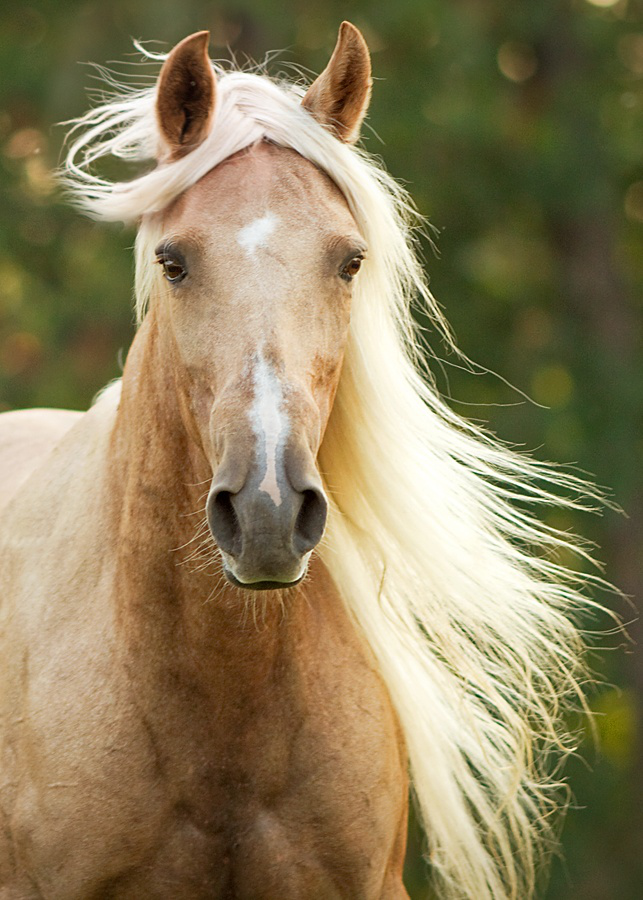

In [20]:
img

In [21]:
img_t = preprocess(img)
batch_t = torch.unsqueeze(img_t, 0)

In [22]:
batch_out = resG(batch_t)

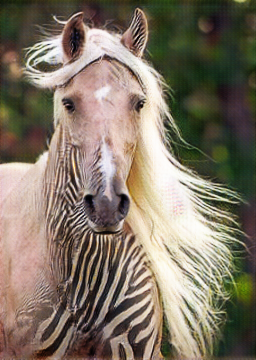

In [23]:
out_t = (batch_out.data.squeeze() + 1.0) / 2.0
out_img = transforms.ToPILImage()(out_t)
out_img

This code converts the output tensor `batch_out` of a PyTorch neural network model into a PIL image using the `transforms.ToPILImage()` function.

The `batch_out` tensor is assumed to have a shape of `(batch_size, num_channels, height, width)`, where `batch_size` is the number of images in the batch, `num_channels` is the number of color channels in the image (e.g., 3 for RGB), and `height` and `width` are the dimensions of the image.

The `squeeze()` method is used to remove any dimensions of size 1 from the tensor, which is necessary if the batch size is 1. The resulting tensor `out_t` has a shape of `(num_channels, height, width)`.

The `+ 1.0` and `/ 2.0` operations are used to normalize the pixel values of the tensor to the range [0, 1]. The resulting tensor `out_t` contains pixel values in the range [0, 1].

The `transforms.ToPILImage()` function is then used to convert the tensor `out_t` into a PIL image. The resulting `out_img` variable can be displayed using a PIL image viewer or saved to disk using the `save()` method of the `PIL.Image` class.

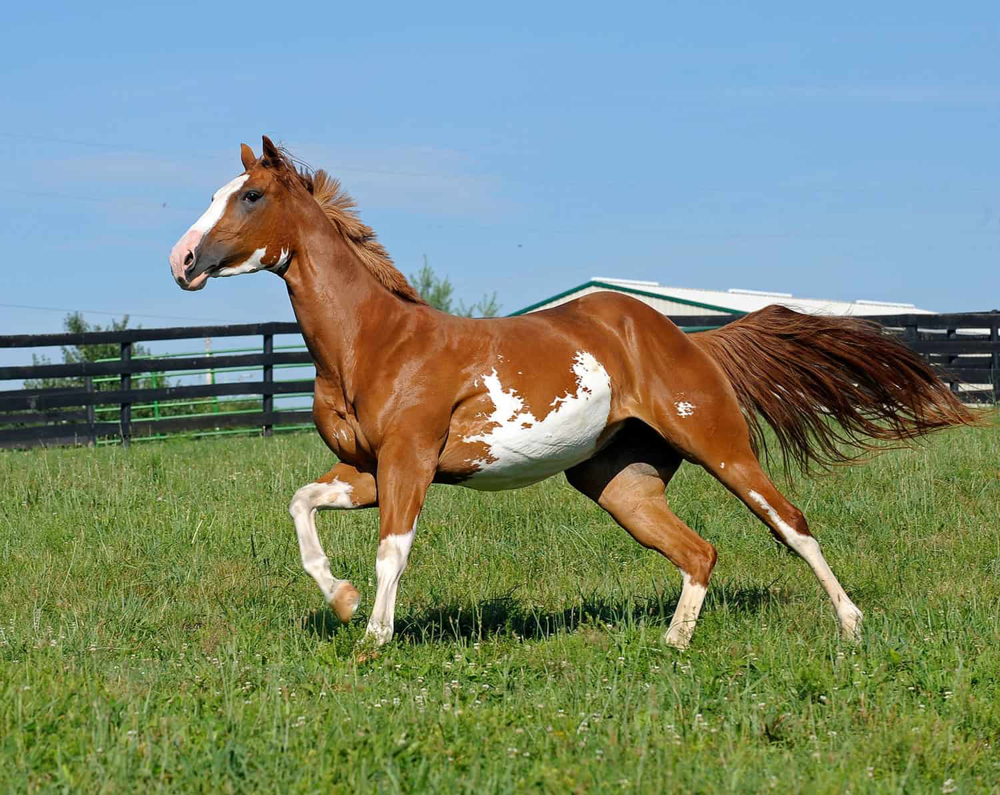

In [24]:
if not os.path.isfile('./paint-horse-running-in-field.jpg'):
    !wget https://thehorse.com/wp-content/uploads/2017/09/paint-horse-running-in-field.jpg
img = Image.open('./paint-horse-running-in-field.jpg')
img

In [25]:
img_t = preprocess(img)
batch_t = torch.unsqueeze(img_t, 0)

In [26]:
batch_out = resG(batch_t)

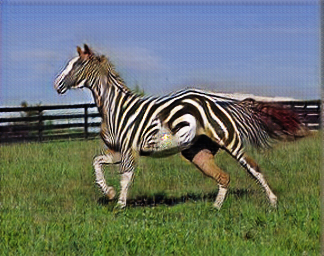

In [27]:
out_t = (batch_out.data.squeeze() + 1.0) / 2.0
out_img = transforms.ToPILImage()(out_t)
out_img

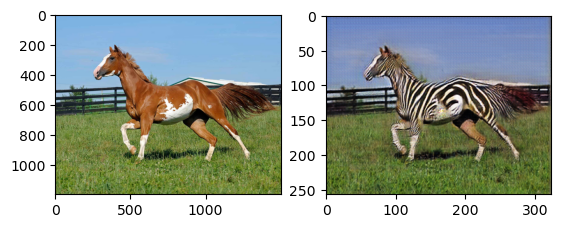

In [28]:
f, axarr = plt.subplots(1,2)
axarr[0].imshow(img);
axarr[1].imshow(out_img);

## 2.7 Summary
1. A pretrained network is a model that has already been trained on a dataset.
Such networks can typically produce useful results immediately after loading
the network parameters.

2. By knowing how to use a pretrained model, we can integrate a neural network
into a project without having to design or train it.

3. AlexNet and ResNet are two deep convolutional networks that set new benchmarks for image recognition in the years they were released.

4. Generative adversarial networks (GANs) have two parts—the generator and the
discriminator—that work together to produce output indistinguishable from
authentic items.

5. CycleGAN uses an architecture that supports converting back and forth
between two different classes of images.

6. NeuralTalk2 uses a hybrid model architecture to consume an image and produce a text description of the image.

7. Torch Hub is a standardized way to load models and weights from any project
with an appropriate hubconf.py file.
